# Stater kit

This notebook provides the basics of 1) how to handle the data, 2) good practices and pitfalls to avoid, 3) how to generate the submission file for codalab

In [13]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import logging
import sys
import os
import json  # for dumping json serialized results
import zipfile  # for creating submission zip file
# from pycocotools.coco import COCO

root = './cowboydata'
logger = logging.getLogger()
logger.addHandler(logging.StreamHandler(sys.stderr))

## Load the training data

In [7]:
coco = COCO(os.path.join(root, 'train.json'))

NameError: name 'COCO' is not defined

Dataset info and categories

In [4]:
print('Data info:', coco.info())
categories = {cat_info['name']:cat_info['id'] for cat_info in coco.loadCats(coco.getCatIds())}
print('Categories:', categories)

description: CowboySuit
url: http://github.com/dmlc/gluon-cv
version: 1.0
year: 2021
contributor: GluonCV/AutoGluon
date_created: 2021/07/01
Data info: None
Categories: {'belt': 87, 'sunglasses': 1034, 'boot': 131, 'cowboy_hat': 318, 'jacket': 588}


## Example training module using AutoGluon

In [14]:
from autogluon.vision import ObjectDetector

OSError: libcudnn.so.7: cannot open shared object file: No such file or directory

In [15]:
train = ObjectDetector.Dataset.from_coco(os.path.join(root, 'train.json'), root=os.path.join(root, 'images'))
train

NameError: name 'ObjectDetector' is not defined

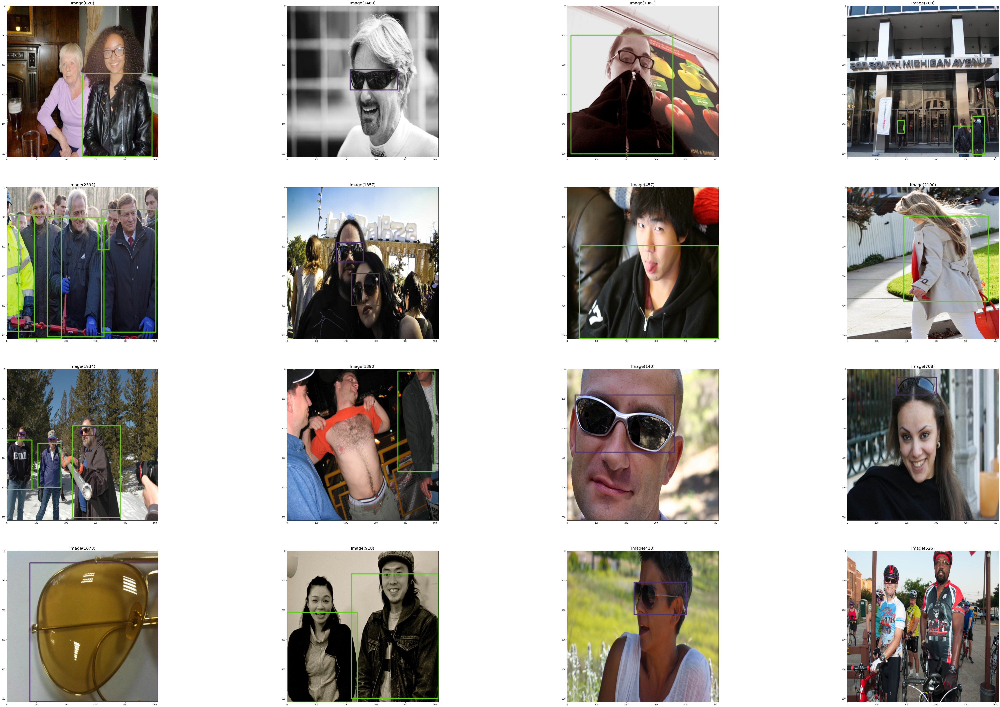

In [7]:
train.show_images()

### Split train/valid data with cautious

Since the distribution of categories is very imbalanced, we should carefully split the data by category, to make sure we have enough sample for evaluation. 

In [8]:
# randomly select 10 images for each category as valid_data
sample_n_per_cat = 10
valid_ids = pd.Int64Index([])
for cat_name in categories.keys():
    df = train[train.apply(lambda x: True if any([y['class'] == cat_name for y in x['rois']]) else False, axis=1)]
    df = df.sample(sample_n_per_cat)
    valid_ids = valid_ids.append(df.index)
train_ids = train.index
train_ids = train_ids.drop(valid_ids)
train_data = train.loc[train_ids]
valid_data = train.loc[valid_ids]
print('train split:', len(train_data), 'valid split', len(valid_data))

train split: 3012 valid split 50


## Training stater code

We provide  a fundamental training example using autogluon.vision package with default settings. In order to achieve higher scores, there are multiple details you need to take care:

- Imbalanced training sample: consider that the training samples for e.g. belt is very rare, you can try methods like class aware sampling to inflate the rare classes
- The training data might contain noises in anotations, there are many custom losses to handle this issue
- others?

In [9]:
detector = ObjectDetector(verbosity=2).fit(train_data, valid_data, hyperparameters={'batch_size': 8, 'epochs': 3, 'transfer': 'ssd_512_resnet50_v1_coco'})

`time_limit=auto` set to `time_limit=7200`.
The number of requested GPUs is greater than the number of available GPUs.Reduce the number to 1
Starting fit without HPO
modified configs(<old> != <new>): {
root.num_workers     4 != 2
root.dataset         voc_tiny != auto
root.gpus            (0, 1, 2, 3) != (0,)
root.dataset_root    ~/.mxnet/datasets/ != auto
root.train.epochs    20 != 3
root.train.early_stop_baseline 0.0 != -inf
root.train.early_stop_patience -1 != 10
root.train.early_stop_max_value 1.0 != inf
root.train.seed      233 != 335
root.train.batch_size 16 != 8
root.valid.batch_size 16 != 8
root.ssd.base_network vgg16_atrous != resnet50_v1
root.ssd.data_shape  300 != 512
}
Saved config to /kaggle/working/6df36e5c/.trial_0/config.yaml
Using transfer learning from ssd_512_resnet50_v1_coco, the other network parameters are ignored.
Model file not found. Downloading.


181189KB [00:07, 23923.98KB/s]                            
Start training from [Epoch 0]
[Epoch 0][Batch 99], Speed: 0.086010 samples/sec, CrossEntropy=4.339552, SmoothL1=2.310706
[Epoch 0][Batch 199], Speed: 0.097777 samples/sec, CrossEntropy=3.745072, SmoothL1=2.213981
[Epoch 0][Batch 299], Speed: 0.095616 samples/sec, CrossEntropy=3.504859, SmoothL1=2.193213
[Epoch 0] Training cost: 320.875771, CrossEntropy=3.386347, SmoothL1=2.158461
[Epoch 0] Validation: 
belt=0.0
sunglasses=0.44154790015179624
boot=0.35192393139607214
cowboy_hat=0.6367191631897514
jacket=0.5645841034269398
mAP=0.39895501963291197
[Epoch 0] Current best map: 0.398955 vs previous 0.000000, saved to /kaggle/working/6df36e5c/.trial_0/best_checkpoint.pkl
[Epoch 1][Batch 99], Speed: 0.096448 samples/sec, CrossEntropy=2.904676, SmoothL1=1.876870
[Epoch 1][Batch 199], Speed: 0.099240 samples/sec, CrossEntropy=2.858389, SmoothL1=1.908737
[Epoch 1][Batch 299], Speed: 0.097126 samples/sec, CrossEntropy=2.813831, SmoothL1=1.

100%|██████████| 57421/57421 [00:03<00:00, 18582.19KB/s]
Finished, total runtime is 1065.32 s
{ 'best_config': { 'batch_size': 8,
                   'dist_ip_addrs': None,
                   'early_stop_baseline': -inf,
                   'early_stop_max_value': inf,
                   'early_stop_patience': 10,
                   'epochs': 3,
                   'final_fit': False,
                   'gpus': [0],
                   'log_dir': '/kaggle/working/6df36e5c',
                   'lr': 0.001,
                   'ngpus_per_trial': 8,
                   'nthreads_per_trial': 128,
                   'num_trials': 1,
                   'num_workers': 2,
                   'search_strategy': 'random',
                   'seed': 335,
                   'time_limits': 7200,
                   'transfer': 'ssd_512_resnet50_v1_coco',
                   'wall_clock_tick': 1626417787.2161448},
  'total_time': 439.05742502212524,
  'train_map': 0.3676893063430008,
  'valid_map': 0.4338001

## Generate submission

You will use `valid.csv` for public phase submission, and `test.csv` for the final phase submission. Note that you only have 3 chance to submit for the final phase so be careful not to submit wrong results on the last day

In [10]:
from PIL import Image
def create_submission(df, detector, score_thresh=0.1):
    results = []
    for index, row in df.iterrows():
        img_id = row['id']
        file_name = row['file_name']
        img = Image.open(file_name)
        width, height = img.size
        output = detector.predict(file_name)
        for _, p in output.iterrows():
            if p['predict_score'] > score_thresh:
                roi = p['predict_rois']
                pred = {'image_id': img_id,
                        'category_id': categories[p['predict_class']],
                        'bbox': [roi['xmin'] * width, roi['ymin'] * height, roi['xmax'] * width, roi['ymax'] * height],
                        'score': p['predict_score']}
                results.append(pred)
    return results

In [11]:
submission_df = pd.read_csv(os.path.join(root, 'valid.csv'))  # replace with test.csv on the last day
submission_df['file_name'] = submission_df.apply(lambda x: os.path.join(root, 'images', x['file_name']), axis=1)
submission = create_submission(submission_df, detector)

NumExpr defaulting to 2 threads.


In [12]:
# create json and zip
submission_name = '/kaggle/working/answer.json'
with open(submission_name, 'w') as f:
    json.dump(submission, f)
zf = zipfile.ZipFile('/kaggle/working/sample_answer.zip', 'w')
zf.write(submission_name, 'answer.json')
zf.close()

## Submit to codalab competition to get the evaluation score

https://competitions.codalab.org/competitions/33573#participate-submit_results

You have to submit the your solution file together with the file submission to win the awards!